# Describtion

1. **player_id**: A unique identifier assigned to each athlete or player. This ensures that each player is distinguishable in the dataset.

2. **Name**: The full name of the athlete.

3. **Sex**: The gender of the athlete, typically represented as "M" for male and "F" for female.

4. **Team**: The name of the team or country that the athlete represented during the event.

5. **NOC**: The National Olympic Committee (NOC) code, which is a three-letter abbreviation representing the athlete's country.

6. **Year**: The year in which the event took place, corresponding to either the Summer or Winter Olympics.

7. **Season**: Indicates whether the event took place in the Summer or Winter Olympics.

8. **City**: The host city where the Olympic Games or event was held.

9. **Sport**: The sport in which the athlete competed, such as athletics, swimming, etc.

10. **Event**: The specific event or competition within the sport, such as 100m sprint, long jump, etc.

11. **Medal**: The type of medal won by the athlete, if any. Values can be "Gold," "Silver," "Bronze," or NaN (no medal).

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

sns.set()

import warnings
warnings.filterwarnings('ignore')


# read data & describe

In [2]:
kaggle_dataset_path = '/kaggle/input/summer-olympics-medals-1896-2024/olympics_dataset.csv'
df = pd.read_csv(kaggle_dataset_path)

#df = pd.read_csv('olympics_dataset.csv')
df.head()

,player_id,Name,Sex,Team,NOC,Year,Season,City,Sport,Event,Medal
0,0,A Dijiang,M,China,CHN,1992,Summer,Barcelona,Basketball,Basketball Men's Basketball,No medal
1,1,A Lamusi,M,China,CHN,2012,Summer,London,Judo,Judo Men's Extra-Lightweight,No medal
2,2,Gunnar Aaby,M,Denmark,DEN,1920,Summer,Antwerpen,Football,Football Men's Football,No medal
3,3,Edgar Aabye,M,Denmark/Sweden,DEN,1900,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold
4,26,Cornelia (-strannood),F,Netherlands,NED,1932,Summer,Los Angeles,Athletics,Athletics Women's 100 metres,No medal


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 252565 entries, 0 to 252564
Data columns (total 11 columns):
 #   Column     Non-Null Count   Dtype 
---  ------     --------------   ----- 
 0   player_id  252565 non-null  int64 
 1   Name       252565 non-null  object
 2   Sex        252565 non-null  object
 3   Team       252565 non-null  object
 4   NOC        252565 non-null  object
 5   Year       252565 non-null  int64 
 6   Season     252565 non-null  object
 7   City       252565 non-null  object
 8   Sport      252565 non-null  object
 9   Event      252565 non-null  object
 10  Medal      252565 non-null  object
dtypes: int64(2), object(9)
memory usage: 21.2+ MB


In [4]:
df.describe(include='all')

,player_id,Name,Sex,Team,NOC,Year,Season,City,Sport,Event,Medal
count,2.525650e+05,252565,252565,252565,252565,252565.000000,252565,252565,252565,252565,252565
unique,NaN,129992,2,1193,234,NaN,1,23,76,1041,4
top,NaN,John Jr.,M,United States,USA,NaN,Summer,Tokyo,Athletics,Football Men's Football,No medal
freq,NaN,76,178544,16236,16774,NaN,252565,22823,43294,5733,213747
mean,2.305499e+05,NaN,NaN,NaN,NaN,1981.743908,NaN,NaN,NaN,NaN,NaN
std,4.289330e+05,NaN,NaN,NaN,NaN,32.596548,NaN,NaN,NaN,NaN,NaN
min,0.000000e+00,NaN,NaN,NaN,NaN,1896.000000,NaN,NaN,NaN,NaN,NaN
25%,5.713700e+04,NaN,NaN,NaN,NaN,1960.000000,NaN,NaN,NaN,NaN,NaN
50%,1.356110e+05,NaN,NaN,NaN,NaN,1988.000000,NaN,NaN,NaN,NaN,NaN
75%,2.118590e+05,NaN,NaN,NaN,NaN,2008.000000,NaN,NaN,NaN,NaN,NaN


In [5]:
df.columns

Index(['player_id', 'Name', 'Sex', 'Team', 'NOC', 'Year', 'Season', 'City',
       'Sport', 'Event', 'Medal'],
      dtype='object')

In [6]:
df.shape

(252565, 11)

In [7]:
df.size

2778215

# Data Cleaning

In [8]:
df_cleaned = df.drop_duplicates(subset=['player_id'])
df_cleaned.duplicated().sum()

0

In [9]:
df.dtypes

player_id     int64
Name         object
Sex          object
Team         object
NOC          object
Year          int64
Season       object
City         object
Sport        object
Event        object
Medal        object
dtype: object

In [10]:
df.isna().sum()

player_id    0
Name         0
Sex          0
Team         0
NOC          0
Year         0
Season       0
City         0
Sport        0
Event        0
Medal        0
dtype: int64

# EDA & Feature Engineering

In [11]:
df['Country'] = df['Team']
df = df.drop(['Team'], axis=1)

In [12]:
def univ_num(df, c):
    fig = px.histogram(df, x=c, marginal='box')
    fig.show()

for c in ['Year']:
    univ_num(df, c)

In [13]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

def univ_cat(df, c):
    # Create subplots: 1 row, 2 columns, specify the second one to be 'domain' (for pie charts)
    fig = make_subplots(
        rows=1, cols=2,
        subplot_titles=['Histogram', 'Pie'],
        specs=[[{'type': 'xy'}, {'type': 'domain'}]]  # 'domain' is for Pie charts
    )

    # Add Histogram to the first subplot (no textinfo here)
    fig.add_trace(go.Histogram(x=df[c]), row=1, col=1)

    # Add Pie chart to the second subplot
    fig.add_trace(go.Pie(labels=df[c].value_counts().index,
                         values=df[c].value_counts(),
                         textinfo='label+percent'), row=1, col=2)

    # Update layout
    fig.update_layout(title_text=f'Univariate Analysis of {c}')

    # Show the plot
    fig.show()

# Run the function for each categorical column
for c in ['Sex', 'Season', 'City', 'Medal']:
    univ_cat(df, c)

In [14]:
top_sport = df['Sport'].value_counts(ascending=False).nlargest(10).reset_index()
top_sport

,Sport,count
0,Athletics,43294
1,Gymnastics,26707
2,Swimming,26416
3,Shooting,12580
4,Rowing,11625
5,Fencing,11558
6,Cycling,10859
7,Football,7906
8,Wrestling,7734
9,Sailing,7266


In [15]:
px.histogram(top_sport, x='Sport', y= 'count',
                   title='top 10 Sport',
                  labels={'Sport': 'Sport', 'count': 'Count'})

Event by Male and Female

In [16]:
df['Event'].value_counts()

Event
Football Men's Football                                5733
Hockey Men's Hockey                                    3958
Water Polo Men's Water Polo                            3358
Basketball Men's Basketball                            3280
Cycling Men's Road Race, Individual                    2947
                                                       ... 
Archery Men's Target Archery, 33 metres, Individual       2
Archery Men's Championnat Du Monde                        2
Sailing Mixed 18 foot                                     2
Basque Pelota Men's Two-Man Teams With Cesta              2
Aeronautics Mixed Aeronautics                             1
Name: count, Length: 1041, dtype: int64

In [17]:
male = df[df['Sex'] == 'M']
top_10_male_sport_event  = male[['Sport', 'Event']].value_counts(ascending=False).nlargest(10).reset_index()

In [18]:
fig = px.bar(top_10_male_sport_event,
             x='Sport',
             y='count',
             color='Event',
             title="Top 10 Most Frequent Sport and Event Combinations for Males",
             labels={'count': 'Frequency'},
             hover_data={'Sport': False, 'Event': True})  # Customize hover information

# Show the plot
fig.show()

In [19]:
female = df[df['Sex'] == 'F']
top_10_female_sport_event = female[['Sport', 'Event']].value_counts(ascending=False).nlargest(10).reset_index()

In [20]:
fig = px.bar(top_10_female_sport_event,
             x='Sport',
             y='count',
             color='Event',
             title="Top 10 Most Frequent Sport and Event Combinations for females",
             labels={'count': 'Frequency'},
             hover_data={'Sport': False, 'Event': True})  # Customize hover information

# Show the plot
fig.show()

Medal

In [21]:
df['Medal'].value_counts()

Medal
No medal    213747
Bronze       13070
Gold         13002
Silver       12746
Name: count, dtype: int64

In [22]:
df_no = pd.get_dummies(df['Medal'])

In [23]:
df_no

,Bronze,Gold,No medal,Silver
0,False,False,True,False
1,False,False,True,False
2,False,False,True,False
3,False,True,False,False
4,False,False,True,False
...,...,...,...,...
252560,False,False,True,False
252561,False,False,True,False
252562,False,True,False,False
252563,True,False,False,False


In [24]:
df_no_filtered = df_no[df_no.any(axis=1)]
df_no_filtered.describe(include='all')

,Bronze,Gold,No medal,Silver
count,252565,252565,252565,252565
unique,2,2,2,2
top,False,False,True,False
freq,239495,239563,213747,239819


In [25]:
df_no.columns

Index(['Bronze', 'Gold', 'No medal', 'Silver'], dtype='object')

In [26]:
df_no.drop(['No medal'], axis=1)

,Bronze,Gold,Silver
0,False,False,False
1,False,False,False
2,False,False,False
3,False,True,False
4,False,False,False
...,...,...,...
252560,False,False,False
252561,False,False,False
252562,False,True,False
252563,True,False,False


In [27]:
df_no.describe(include='all')

,Bronze,Gold,No medal,Silver
count,252565,252565,252565,252565
unique,2,2,2,2
top,False,False,True,False
freq,239495,239563,213747,239819


In [28]:
df_no['Bronze'].value_counts()

Bronze
False    239495
True      13070
Name: count, dtype: int64

In [29]:
# Create a pie chart
fig = px.pie(df_no, names=['Bronze','Gold','Silver'], title='SEX Pie Chart by Medal')

# Display the chart
fig.show()

In [30]:
df_copy = df.copy()
df_copy['Medal'] = df_copy['Medal'][df_copy['Medal'] != 'No medal']
df_copy['Medal'].value_counts()

Medal
Bronze    13070
Gold      13002
Silver    12746
Name: count, dtype: int64

In [31]:
df_copy_nomedal = df.copy()

df_copy_nomedal['Medal'] = df_copy_nomedal['Medal'][df_copy_nomedal['Medal'] == 'No medal']
df_copy_nomedal['Medal'].value_counts()

Medal
No medal    213747
Name: count, dtype: int64

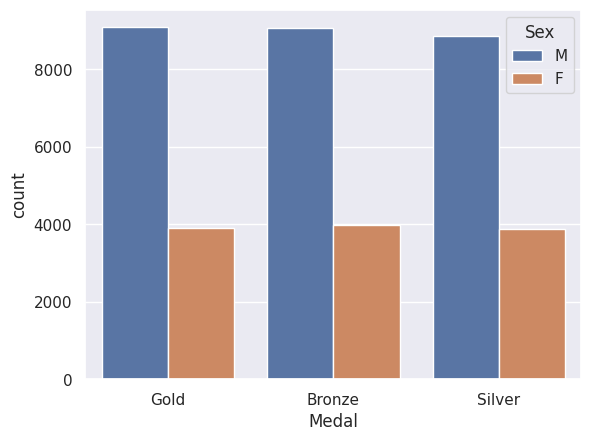

In [32]:
sns.countplot(data=df_copy, x='Medal', hue='Sex')
plt.show()

In [33]:
px.histogram(df_copy, x='Medal', color='Sex', barmode='group',
                   title='Count of Medals by Sex',
                   labels={'Medal': 'Medal Type', 'count': 'Count'})

In [34]:
px.histogram(df_copy_nomedal, x='Medal', color='Sex', barmode='group',
                   title='Count of No Medals by Sex',
                   labels={'Medal': 'Medal Type', 'count': 'Count'})

In [35]:
df['won_or_not'] = np.where(df['Medal'].isin(['Gold', 'Bronze', 'Silver']), 1, 0)

In [36]:
df['won_or_not'].value_counts()

won_or_not
0    213747
1     38818
Name: count, dtype: int64

In [37]:
# Create a pie chart
fig = px.pie(df, names='won_or_not', title='won_or_not Pie Chart')

# Display the chart
fig.show()

In [38]:
px.histogram(df, x='won_or_not', color='Sex', barmode='group',
                   title='Count of won_or_not by Sex',
                   labels={'Medal': 'Medal Type', 'count': 'Count'})

# Features: gold & silver & bronze medals
### Description: Calculate the total number of medals won by each country across all Olympic Games.
### Use: This feature will allow you to track which countries have been the most successful over the history of the Olympics. It can also be used for comparative analysis across countries.

In [39]:
# Step 1: Create the Gold_Count column that counts the gold medals for each NOC
df['Gold_Count'] = df[df['Medal'] == 'Gold'].groupby('NOC')['Medal'].transform('count')

# Step 2: Get the total number of gold medals won by each country
gold_medal_counts = df.groupby('NOC')['Gold_Count'].sum().reset_index()

# Step 3: Sort countries by total gold medals and select the top 2
top_2_noc = gold_medal_counts.nlargest(10, 'Gold_Count')['NOC']

# Step 4: Filter the original dataset for only the top 2 countries
top_2_gold_medals_df = df[df['NOC'].isin(top_2_noc)]

# Step 5: Limit to the top 10 sports by number of gold medals won
top_sports = top_2_gold_medals_df['Sport'].value_counts().nlargest(5).index
filtered_df = top_2_gold_medals_df[top_2_gold_medals_df['Sport'].isin(top_sports)]

# Step 6: Group by NOC, Year, and Sport to count gold medals per year for each country by sport
gold_medals_per_year_sport = filtered_df.groupby(['NOC', 'Year', 'Sport'])['Gold_Count'].count().reset_index()
gold_medals_per_year_sport.columns = ['NOC', 'Year', 'Sport', 'Gold_Count']

# Step 7: Create the bar plot for the top 2 countries with sport as an additional column
fig = px.bar(gold_medals_per_year_sport, x='Year', y='Gold_Count', color='NOC',
              facet_col='Sport', # Add sport as a facet column to create a subplot for each sport
              title='Gold Medals Won by Top 10 Countries Across Top 5 Sports Over the Years',
              labels={'Gold_Count': 'Number of Gold Medals', 'Year': 'Year', 'Sport': 'Sport'},
              facet_col_spacing=0.03)  # Adjust the spacing

# Show the plot
fig.show()


In [40]:
# Step 2: Get the total number of gold medals won by each country
gold_medal_counts = df.groupby('NOC')['Gold_Count'].count().reset_index()

# Step 3: Sort countries by total gold medals and select the top 10
top_10_noc = gold_medal_counts.nlargest(10, 'Gold_Count')['NOC']

# Step 4: Filter the original dataset for only the top 10 countries
top_10_gold_medals_df = df[df['NOC'].isin(top_10_noc)]

# Step 5: Group by NOC and Year to count gold medals per year for each country
gold_medals_per_year = top_10_gold_medals_df.groupby(['NOC', 'Year'])['Gold_Count'].count().reset_index()
gold_medals_per_year.columns = ['NOC', 'Year', 'Gold_Count']

# Step 6: Create the line plot for the top 10 countries
fig = px.bar(gold_medals_per_year, x='Year', y='Gold_Count', color='NOC',
              title='Gold Medals Won by Top 10 Countries Over the Years',
              labels={'Gold_Count': 'Number of Gold Medals', 'Year': 'Year'})

# Show the plot
fig.show()

In [41]:
# Step 1: Create the Silver_Count column that counts the silver medals for each NOC
df['Silver_Count'] = df[df['Medal'] == 'Silver'].groupby('NOC')['Medal'].transform('count')

# Step 2: Get the total number of silver medals won by each country
silver_medal_counts = df.groupby('NOC')['Silver_Count'].sum().reset_index()

# Step 3: Sort countries by total silver medals and select the top 2
top_2_noc_silver = silver_medal_counts.nlargest(10, 'Silver_Count')['NOC']

# Step 4: Filter the original dataset for only the top 2 countries
top_2_silver_medals_df = df[df['NOC'].isin(top_2_noc_silver)]

# Step 5: Limit to the top 10 sports by number of silver medals won
top_sports_silver = top_2_silver_medals_df['Sport'].value_counts().nlargest(5).index
filtered_silver_df = top_2_silver_medals_df[top_2_silver_medals_df['Sport'].isin(top_sports_silver)]

# Step 6: Group by NOC, Year, and Sport to count silver medals per year for each country by sport
silver_medals_per_year_sport = filtered_silver_df.groupby(['NOC', 'Year', 'Sport'])['Silver_Count'].count().reset_index()
silver_medals_per_year_sport.columns = ['NOC', 'Year', 'Sport', 'Silver_Count']

# Step 7: Create the bar plot for the top 2 countries with sport as an additional column for silver medals
fig_silver = px.bar(silver_medals_per_year_sport, x='Year', y='Silver_Count', color='NOC',
                    facet_col='Sport', # Add sport as a facet column to create a subplot for each sport
                    title='Silver Medals Won by Top 10 Countries Across Top 5 Sports Over the Years',
                    labels={'Silver_Count': 'Number of Silver Medals', 'Year': 'Year', 'Sport': 'Sport'},
                    facet_col_spacing=0.03)  # Adjust the spacing

# Show the plot
fig_silver.show()


In [42]:
# Step 2: Get the total number of gold medals won by each country
gold_medal_counts = df.groupby('NOC')['Silver_Count'].count().reset_index()

# Step 3: Sort countries by total gold medals and select the top 10
top_10_noc = gold_medal_counts.nlargest(10, 'Silver_Count')['NOC']

# Step 4: Filter the original dataset for only the top 10 countries
top_10_gold_medals_df = df[df['NOC'].isin(top_10_noc)]

# Step 5: Group by NOC and Year to count gold medals per year for each country
gold_medals_per_year = top_10_gold_medals_df.groupby(['NOC', 'Year'])['Silver_Count'].count().reset_index()
gold_medals_per_year.columns = ['NOC', 'Year', 'Silver_Count']

# Step 6: Create the line plot for the top 10 countries
fig = px.bar(gold_medals_per_year, x='Year', y='Silver_Count', color='NOC',
              title='Silver Medals Won by Top 10 Countries Over the Years',
              labels={'Silver_Count': 'Number of silver Medals', 'Year': 'Year'})

# Show the plot
fig.show()

In [43]:
# Step 1: Create the Bronze_Count column that counts the bronze medals for each NOC
df['Bronze_Count'] = df[df['Medal'] == 'Bronze'].groupby('NOC')['Medal'].transform('count')

# Step 2: Get the total number of bronze medals won by each country
bronze_medal_counts = df.groupby('NOC')['Bronze_Count'].sum().reset_index()

# Step 3: Sort countries by total bronze medals and select the top 2
top_2_noc_bronze = bronze_medal_counts.nlargest(10, 'Bronze_Count')['NOC']

# Step 4: Filter the original dataset for only the top 2 countries
top_2_bronze_medals_df = df[df['NOC'].isin(top_2_noc_bronze)]

# Step 5: Limit to the top 10 sports by number of bronze medals won
top_sports_bronze = top_2_bronze_medals_df['Sport'].value_counts().nlargest(5).index
filtered_bronze_df = top_2_bronze_medals_df[top_2_bronze_medals_df['Sport'].isin(top_sports_bronze)]

# Step 6: Group by NOC, Year, and Sport to count bronze medals per year for each country by sport
bronze_medals_per_year_sport = filtered_bronze_df.groupby(['NOC', 'Year', 'Sport'])['Bronze_Count'].count().reset_index()
bronze_medals_per_year_sport.columns = ['NOC', 'Year', 'Sport', 'Bronze_Count']

# Step 7: Create the bar plot for the top 2 countries with sport as an additional column for bronze medals
fig_bronze = px.bar(bronze_medals_per_year_sport, x='Year', y='Bronze_Count', color='NOC',
                    facet_col='Sport', # Add sport as a facet column to create a subplot for each sport
                    title='Bronze Medals Won by Top 10 Countries Across Top 5 Sports Over the Years',
                    labels={'Bronze_Count': 'Number of Bronze Medals', 'Year': 'Year', 'Sport': 'Sport'},
                    facet_col_spacing=0.03)  # Adjust the spacing

# Show the plot
fig_bronze.show()


In [44]:
# Step 2: Get the total number of gold medals won by each country
gold_medal_counts = df.groupby('NOC')['Bronze_Count'].sum().reset_index()

# Step 3: Sort countries by total gold medals and select the top 10
top_10_noc = gold_medal_counts.nlargest(10, 'Bronze_Count')['NOC']

# Step 4: Filter the original dataset for only the top 10 countries
top_10_gold_medals_df = df[df['NOC'].isin(top_10_noc)]

# Step 5: Group by NOC and Year to count gold medals per year for each country
gold_medals_per_year = top_10_gold_medals_df.groupby(['NOC', 'Year'])['Bronze_Count'].count().reset_index()
gold_medals_per_year.columns = ['NOC', 'Year', 'Bronze_Count']

# Step 6: Create the line plot for the top 10 countries
fig = px.bar(gold_medals_per_year, x='Year', y='Bronze_Count', color='NOC',
              title='Bronze Medals Won by Top 10 Countries Over the Years',
              labels={'Bronze_Count': 'Number of Bronze Medals', 'Year': 'Year'})

# Show the plot
fig.show()

In [45]:
df['Total_Medals'] = df.groupby('player_id')['Medal'].transform(lambda x: (x != 'No medal').sum())

In [46]:
df['Total_Medals'].value_counts()

Total_Medals
0    209871
1     41549
2       961
3        97
4        54
5        27
6         6
Name: count, dtype: int64

In [47]:
# Filter athletes with at least one medal
athlete_medals = df[df['Total_Medals'] > 0].groupby('Name')['Total_Medals'].max().reset_index()

# Sort by total medals and select top 20 athletes for visualization
athlete_medals_top = athlete_medals.sort_values('Total_Medals', ascending=False).head(20)

# Create a bar chart for the top 20 athletes
fig = px.bar(athlete_medals_top, x='Name', y='Total_Medals',
             title='Top 20 Athletes by Total Medals Won',
             labels={'Total_Medals': 'Total Medals'},
             color='Total_Medals')
fig.show()

In [48]:
# Create a new column to count total medals won by each country (NOC) for each player
df['Total_Medals_country'] = df.groupby('NOC')['Medal'].transform(lambda x: (x != 'No medal').sum())

# Display the new column
df[['NOC', 'Total_Medals_country']]


,NOC,Total_Medals_country
0,CHN,1218
1,CHN,1218
2,DEN,666
3,DEN,666
4,NED,1108
...,...,...
252560,GEQ,0
252561,ITA,1604
252562,NED,1108
252563,FRA,1955


In [49]:
top_NOC_m = df.groupby('NOC')['Total_Medals_country'].value_counts(ascending=False).nlargest(10).reset_index()

fig = px.bar(top_NOC_m, x='NOC', y='Total_Medals_country',
             title='Top 10 NOC by Total Medals Won',
             labels={'Total_Medals_country': 'Total Total_Medals_country'},
             color='Total_Medals_country')
fig.show()

In [50]:
df = df.drop(['Gold_Count','Silver_Count','Bronze_Count','Total_Medals','Total_Medals_country'], axis=1)

In [51]:
#df.to_csv('preprocessing_olymbic.csv', index=False)

# outlier

In [52]:
df = df.drop(['player_id','Country' ], axis=1)

In [53]:
df_cat = df.select_dtypes(exclude=['float64', 'int64', 'int32'])
df_num = df.select_dtypes(include=['float64', 'int64', 'int32'])

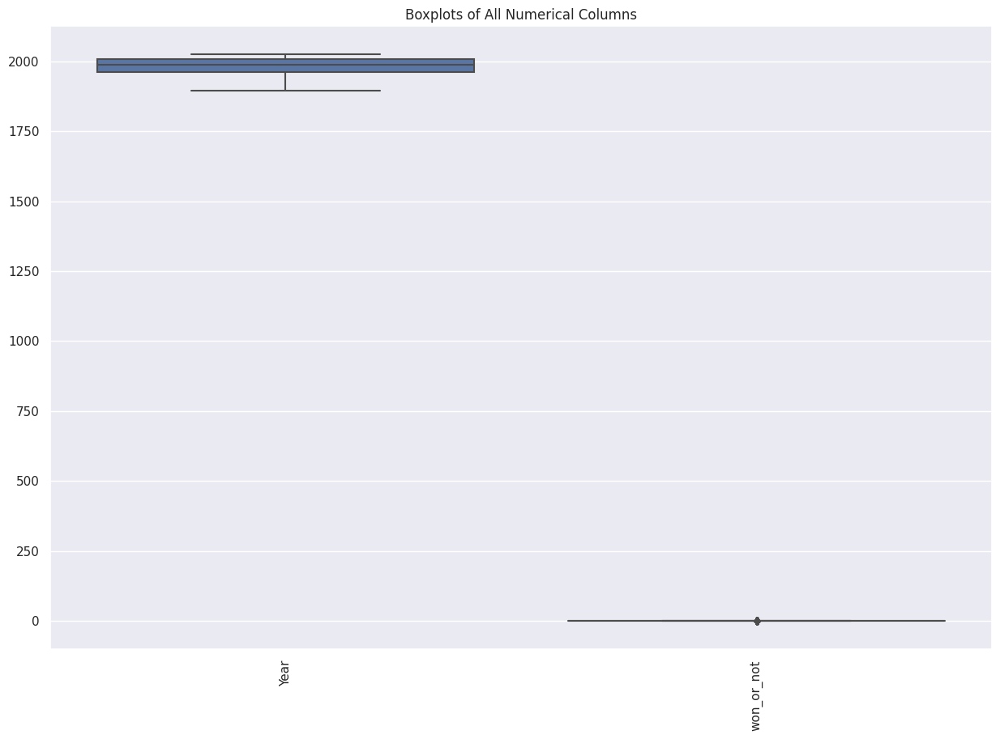

In [54]:
plt.figure(figsize=(15, 10))
sns.boxplot(df_num)
plt.xticks(rotation=90)
plt.title('Boxplots of All Numerical Columns')
plt.show()

In [55]:
df_cat

,Name,Sex,NOC,Season,City,Sport,Event,Medal
0,A Dijiang,M,CHN,Summer,Barcelona,Basketball,Basketball Men's Basketball,No medal
1,A Lamusi,M,CHN,Summer,London,Judo,Judo Men's Extra-Lightweight,No medal
2,Gunnar Aaby,M,DEN,Summer,Antwerpen,Football,Football Men's Football,No medal
3,Edgar Aabye,M,DEN,Summer,Paris,Tug-Of-War,Tug-Of-War Men's Tug-Of-War,Gold
4,Cornelia (-strannood),F,NED,Summer,Los Angeles,Athletics,Athletics Women's 100 metres,No medal
...,...,...,...,...,...,...,...,...
252560,Sefora Ada,F,GEQ,Summer,Paris,Athletics,Women's 100m,No medal
252561,Emanuela Liuzzi,F,ITA,Summer,Paris,Wrestling,Women's Freestyle 50kg,No medal
252562,Isayah Boers,M,NED,Summer,Paris,Athletics,4 x 400m Relay Mixed,Gold
252563,Kevin Staut,M,FRA,Summer,Paris,Equestrian,Jumping Team,Bronze


In [56]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 252565 entries, 0 to 252564
Data columns (total 10 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   Name        252565 non-null  object
 1   Sex         252565 non-null  object
 2   NOC         252565 non-null  object
 3   Year        252565 non-null  int64 
 4   Season      252565 non-null  object
 5   City        252565 non-null  object
 6   Sport       252565 non-null  object
 7   Event       252565 non-null  object
 8   Medal       252565 non-null  object
 9   won_or_not  252565 non-null  int64 
dtypes: int64(2), object(8)
memory usage: 19.3+ MB


In [57]:
from sklearn.preprocessing import LabelEncoder

# Create a LabelEncoder object
label_encoder = LabelEncoder()

# Apply label encoding to a categorical column
df['Sex'] = label_encoder.fit_transform(df['Sex'])
df['NOC'] = label_encoder.fit_transform(df['NOC'])
df['Season'] = label_encoder.fit_transform(df['Season'])
df['City'] = label_encoder.fit_transform(df['City'])
df['Sport'] = label_encoder.fit_transform(df['Sport'])
df['Event'] = label_encoder.fit_transform(df['Event'])
df['Medal'] = label_encoder.fit_transform(df['Medal'])

In [58]:
df = df.drop(['Name'], axis=1)

In [59]:
#df.to_csv('olymbic.csv', index=False)

In [60]:
df_corr = df.corr()
df_corr

,Sex,NOC,Year,Season,City,Sport,Event,Medal,won_or_not
Sex,1.000000,0.016078,-0.317697,NaN,-0.045098,-0.013621,-0.170076,0.004317,-0.010138
NOC,0.016078,1.000000,-0.058641,NaN,0.022712,-0.015037,-0.020588,-0.031611,0.066922
Year,-0.317697,-0.058641,1.000000,NaN,0.161770,0.041665,0.175249,0.014468,-0.049243
Season,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
City,-0.045098,0.022712,0.161770,NaN,1.000000,0.010197,0.111861,0.000390,-0.004541
Sport,-0.013621,-0.015037,0.041665,NaN,0.010197,1.000000,0.810469,-0.026929,0.060171
Event,-0.170076,-0.020588,0.175249,NaN,0.111861,0.810469,1.000000,-0.021115,0.046638
Medal,0.004317,-0.031611,0.014468,NaN,0.000390,-0.026929,-0.021115,1.000000,-0.449238
won_or_not,-0.010138,0.066922,-0.049243,NaN,-0.004541,0.060171,0.046638,-0.449238,1.000000


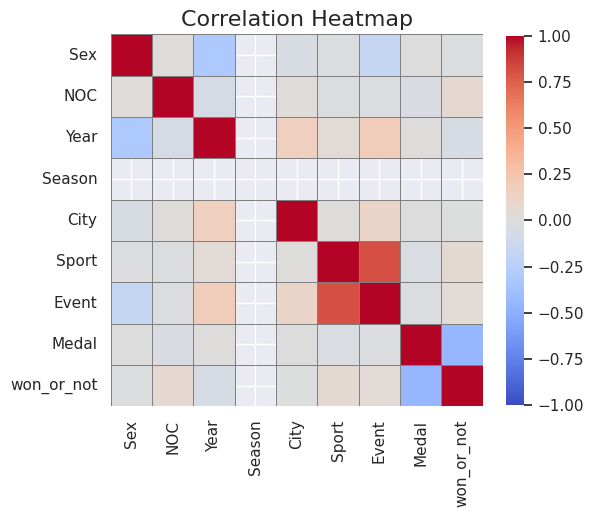

In [61]:
plt.figure(figsize=(6, 6))  # Adjust size as needed

# Create the heatmap without numbers
sns.heatmap(
    df_corr,
    cmap='coolwarm',       # Choose a color map
    vmin=-1, vmax=1,       # Set the range of values for color map
    linewidths=0.5,        # Add lines between cells
    linecolor='grey',      # Color of the lines between cells
    square=True,           # Make the heatmap square
    cbar_kws={"shrink": .8} # Adjust the color bar size
)

# Add titles and labels
plt.title('Correlation Heatmap', size=16)
plt.show()

In [62]:
positive_corr_order_status = df_corr['won_or_not'][df_corr['won_or_not'] >= 0]

# Remove the correlation with itself
positive_corr_order_status = positive_corr_order_status[positive_corr_order_status != 1]

# Reset the index to convert Series to DataFrame
positive_corr_order_status = positive_corr_order_status.reset_index()

# Rename columns for clarity
positive_corr_order_status.columns = ['Feature', 'Correlation']
positive_corr_delivery_type = positive_corr_order_status.sort_values(by='Correlation', ascending=False)


# Display the features with correlation > 0 with 'order_status'
print("Features with correlation greater than 0 with 'won_or_not':")
print(positive_corr_delivery_type)

Features with correlation greater than 0 with 'won_or_not':
  Feature  Correlation
0     NOC     0.066922
1   Sport     0.060171
2   Event     0.046638


In [63]:
#!pip install lightgbm

from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
import xgboost as xgb
import lightgbm as lgb
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay, roc_auc_score
from imblearn.over_sampling import SMOTE

In [64]:
X = df.drop(['Season','won_or_not'], axis=1)
y = df['won_or_not']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [65]:
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)
print(f"Resampled class distribution: \n{y_train_resampled.value_counts()}")

Resampled class distribution: 
won_or_not
0    149601
1    149601
Name: count, dtype: int64


In [66]:
model = RandomForestClassifier(random_state=42)
model.fit(X_train_resampled, y_train_resampled)
y_pred = model.predict(X_test)
print("Classification Report:\n", classification_report(y_test, y_pred))
roc_auc = roc_auc_score(y_test, model.predict_proba(X_test)[:, 1])
print(f"ROC-AUC Score: {roc_auc:.2f}")

Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.99      0.99     64146
           1       0.94      1.00      0.97     11624

    accuracy                           0.99     75770
   macro avg       0.97      0.99      0.98     75770
weighted avg       0.99      0.99      0.99     75770

ROC-AUC Score: 1.00


In [67]:
# Step 5: Define a function to train and evaluate models
def train_and_evaluate_model(model, model_name):
    model.fit(X_train_resampled, y_train_resampled)
    y_pred = model.predict(X_test)
    print(f"--- {model_name} ---")
    print("Classification Report:\n", classification_report(y_test, y_pred))
    roc_auc = roc_auc_score(y_test, model.predict_proba(X_test)[:, 1])
    print(f"ROC-AUC Score: {roc_auc:.2f}\n")

# Step 6: Train and evaluate different models
models = {
    "Logistic Regression": LogisticRegression(class_weight='balanced', max_iter=1000),
    "Decision Tree": DecisionTreeClassifier(class_weight='balanced', random_state=42),
    "Random Forest": RandomForestClassifier(class_weight='balanced', random_state=42),
    #"Support Vector Machine": SVC(class_weight='balanced', probability=True),
    "XGBoost": xgb.XGBClassifier(scale_pos_weight=(len(y) - sum(y)) / sum(y), random_state=42),
    "LightGBM": lgb.LGBMClassifier(class_weight='balanced', random_state=42)
}

for model_name, model in models.items():
    train_and_evaluate_model(model, model_name)

--- Logistic Regression ---
Classification Report:
               precision    recall  f1-score   support

           0       0.94      0.96      0.95     64146
           1       0.73      0.67      0.70     11624

    accuracy                           0.91     75770
   macro avg       0.84      0.81      0.83     75770
weighted avg       0.91      0.91      0.91     75770

ROC-AUC Score: 0.67

--- Decision Tree ---
Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.98      0.99     64146
           1       0.91      1.00      0.95     11624

    accuracy                           0.99     75770
   macro avg       0.96      0.99      0.97     75770
weighted avg       0.99      0.99      0.99     75770

ROC-AUC Score: 0.99

--- Random Forest ---
Classification Report:
               precision    recall  f1-score   support

           0       1.00      0.99      0.99     64146
           1       0.94      1.00      0.97     116

# Importance features

In [68]:
X = df[['NOC','Sport','Event']]
y = df['won_or_not']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

In [69]:
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)
print(f"Resampled class distribution: \n{y_train_resampled.value_counts()}")

Resampled class distribution: 
won_or_not
0    149601
1    149601
Name: count, dtype: int64


In [70]:
model = RandomForestClassifier(random_state=42)
model.fit(X_train_resampled, y_train_resampled)
y_pred = model.predict(X_test)
print("Classification Report:\n", classification_report(y_test, y_pred))
roc_auc = roc_auc_score(y_test, model.predict_proba(X_test)[:, 1])
print(f"ROC-AUC Score: {roc_auc:.2f}")

Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.81      0.87     64146
           1       0.42      0.76      0.54     11624

    accuracy                           0.80     75770
   macro avg       0.68      0.78      0.71     75770
weighted avg       0.87      0.80      0.82     75770

ROC-AUC Score: 0.87


In [71]:
# Step 5: Define a function to train and evaluate models
def train_and_evaluate_model(model, model_name):
    model.fit(X_train_resampled, y_train_resampled)
    y_pred = model.predict(X_test)
    print(f"--- {model_name} ---")
    print("Classification Report:\n", classification_report(y_test, y_pred))
    roc_auc = roc_auc_score(y_test, model.predict_proba(X_test)[:, 1])
    print(f"ROC-AUC Score: {roc_auc:.2f}\n")

# Step 6: Train and evaluate different models
models = {
    "Logistic Regression": LogisticRegression(class_weight='balanced', max_iter=1000),
    "Decision Tree": DecisionTreeClassifier(class_weight='balanced', random_state=42),
    "Random Forest": RandomForestClassifier(class_weight='balanced', random_state=42),
    "XGBoost": xgb.XGBClassifier(scale_pos_weight=(len(y) - sum(y)) / sum(y), random_state=42),
    "LightGBM": lgb.LGBMClassifier(class_weight='balanced', random_state=42)
}

for model_name, model in models.items():
    train_and_evaluate_model(model, model_name)

--- Logistic Regression ---
Classification Report:
               precision    recall  f1-score   support

           0       0.87      0.55      0.68     64146
           1       0.18      0.55      0.27     11624

    accuracy                           0.55     75770
   macro avg       0.53      0.55      0.48     75770
weighted avg       0.77      0.55      0.62     75770

ROC-AUC Score: 0.57

--- Decision Tree ---
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.81      0.87     64146
           1       0.42      0.76      0.54     11624

    accuracy                           0.80     75770
   macro avg       0.68      0.78      0.71     75770
weighted avg       0.87      0.80      0.82     75770

ROC-AUC Score: 0.86

--- Random Forest ---
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.81      0.87     64146
           1       0.42      0.76      0.54     116

In [72]:
from sklearn.model_selection import StratifiedKFold
import joblib

kf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
smote = SMOTE(random_state=42)

accuracies = []
best_model = None
best_accuracy = 0

# K-Fold Cross-Validation with SMOTE and RandomForest
for train_index, test_index in kf.split(X, y):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y.iloc[train_index], y.iloc[test_index]

    # Apply SMOTE to the training data
    X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

    # Train the RandomForest model
    model = RandomForestClassifier(random_state=42)
    model.fit(X_train_resampled, y_train_resampled)

    # Predict and evaluate
    y_pred = model.predict(X_test)
    acc = accuracy_score(y_test, y_pred)
    accuracies.append(acc)
    print(f"Accuracy for this fold: {acc:.4f}")

    # Save the best model
    if acc > best_accuracy:
        best_accuracy = acc
        best_model = model

Accuracy for this fold: 0.7987
Accuracy for this fold: 0.7971
Accuracy for this fold: 0.8022
Accuracy for this fold: 0.8002
Accuracy for this fold: 0.7993


In [73]:
import numpy as np
# Step 5: Calculate the mean accuracy across all folds
mean_accuracy = np.mean(accuracies)
print(f"\nMean Accuracy across all folds: {mean_accuracy:.4f}")


Mean Accuracy across all folds: 0.7995
